In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import TimeSeriesSplit 
from tqdm import tqdm
import statsmodels.api as sm
from pylab import rcParams
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt


def pars_time(df):
    df['dow'] = df.epoch.dt.dayofweek
    df['hour'] = df.epoch.dt.hour
    df['minute'] = df.epoch.dt.minute
    df['second'] = df.epoch.dt.second
    df['microsecond'] = df.epoch.dt.microsecond
    
    
def set_error_column(df):
    df['error'] = np.linalg.norm(df[['x', 'y', 'z']].values - df[['x_sim', 'y_sim', 'z_sim']].values, axis=1)
    
    
def smape(y_true, y_pred):
    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)
    return np.mean(2 * np.absolute(y_pred - y_true) / (np.absolute(y_true) + np.absolute(y_pred)))


def gen_groups(df, n_groups=600):
    for i in range(n_groups):
        yield df[df['sat_id'] == i]
        

def gen_val_data(X, y, n_splits = 12):
    tscv = TimeSeriesSplit(n_splits)
    for train_idx, test_idx in tscv.split(X):
        yield X[train_idx], y[train_idx], X[test_idx], y[test_idx]
        
        
def save_submit(submit, test, name='sub.csv'):
    test['error'] = submit
    res = test['error'].sort_index()
    res.to_csv(name, index=True)

In [2]:
data_path = '/kaggle/input/sputnik-sphere-2020-a/train.csv'

df = pd.read_csv(data_path, parse_dates=['epoch'], index_col='id')
df.head(3)

,epoch,sat_id,x,y,z,x_sim,y_sim,z_sim,type
id,,,,,,,,,
0,2014-01-01 00:00:00.000,0,-8855.823863,13117.780146,-20728.353233,-8843.131454,13138.221690,-20741.615306,train
1,2014-01-01 00:46:43.000,0,-10567.672384,1619.746066,-24451.813271,-10555.500066,1649.289367,-24473.089556,train
2,2014-01-01 01:33:26.001,0,-10578.684043,-10180.467460,-24238.280949,-10571.858472,-10145.939908,-24271.169776,train


In [3]:
print(df.shape)
print(df['type'].value_counts())

(649912, 9)
train    487204
test     162708
Name: type, dtype: int64


In [4]:
train = df[df['type'] == 'train'].copy()
test = df[df['type'] == 'test'].copy()
print('All objects included:', train.shape[0] + test.shape[0] == df.shape[0])

All objects included: True


In [5]:
train.sort_values(by=['epoch'], inplace=True)
test.sort_values(by=['epoch'], inplace=True)

In [6]:
pars_time(train)
pars_time(test)

set_error_column(train)

In [7]:
test.drop(['x', 'y', 'z'], axis=1, inplace=True)

(600,) 0 599
(600,) 0 599
<class 'pandas.core.frame.DataFrame'>
Int64Index: 487204 entries, 0 to 287689
Data columns (total 15 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   epoch        487204 non-null  datetime64[ns]
 1   sat_id       487204 non-null  int64         
 2   x            487204 non-null  float64       
 3   y            487204 non-null  float64       
 4   z            487204 non-null  float64       
 5   x_sim        487204 non-null  float64       
 6   y_sim        487204 non-null  float64       
 7   z_sim        487204 non-null  float64       
 8   type         487204 non-null  object        
 9   dow          487204 non-null  int64         
 10  hour         487204 non-null  int64         
 11  minute       487204 non-null  int64         
 12  second       487204 non-null  int64         
 13  microsecond  487204 non-null  int64         
 14  error        487204 non-null  float64       
dtypes: datet

(array([ 6431.,  5525.,  4506.,  2561.,  2531.,  3270.,  6946.,  4960.,
         5930.,  5897.,  5429.,  4404.,  2857.,  4907.,  3132.,  3380.,
         3177.,  2159.,  4182.,  3136.,  4986.,  3514.,  6686.,  5792.,
         5497.,  2224.,  5714.,  4330.,  3603.,  2455.,  5960.,  7703.,
         1701.,  2243.,  9153.,  6219.,  3137.,  4003.,  4321.,  5410.,
         4086.,  3514.,  5880.,  2569.,  1425.,  7317.,  3557.,  7070.,
         5090., 11375.,  2353.,  8273.,  5872.,  9835.,  5063.,  5861.,
         2970.,  5405.,  2226.,  5998.,  5406.,  3130.,  7786.,  5657.,
         5753.,  3923.,  2076.,  4978.,  5725.,  3612.,  4416.,  6209.,
         4577.,  2093.,  4743.,  3499.,  7364.,  4287.,  8556.,  7534.,
         1930.,  8621.,  5240.,  4983.,  3928.,  4284.,  2621.,  7758.,
         7701.,  6767.,  2183.,  2228.,  9006.,  2684.,  3708.,  3822.,
         3272.,  7325.,  8438.,  3671.]),
 array([  0.  ,   5.99,  11.98,  17.97,  23.96,  29.95,  35.94,  41.93,
         47.92,  53.91

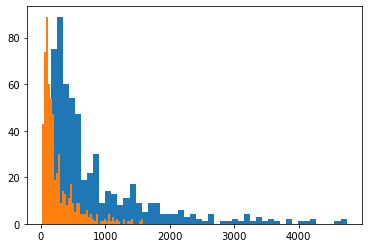

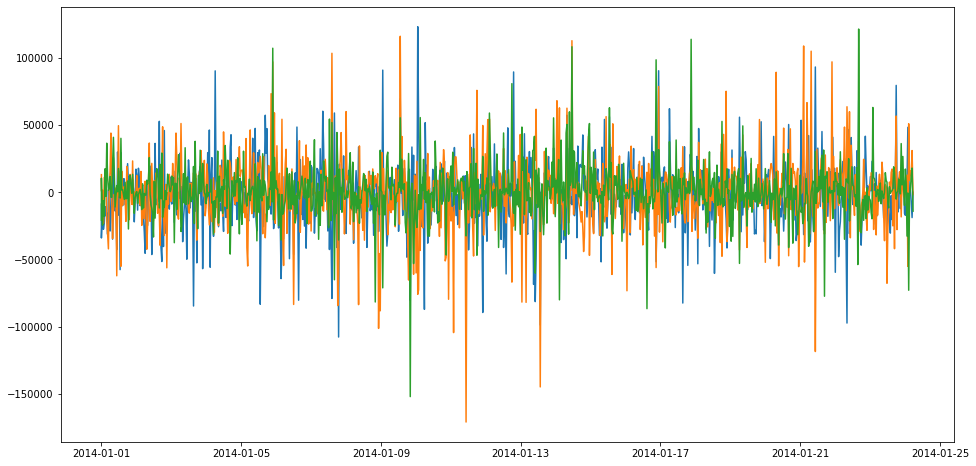

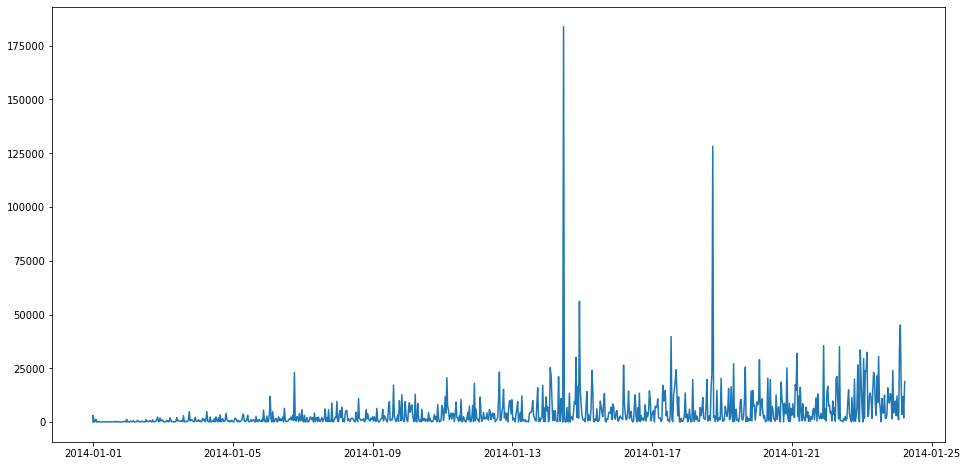

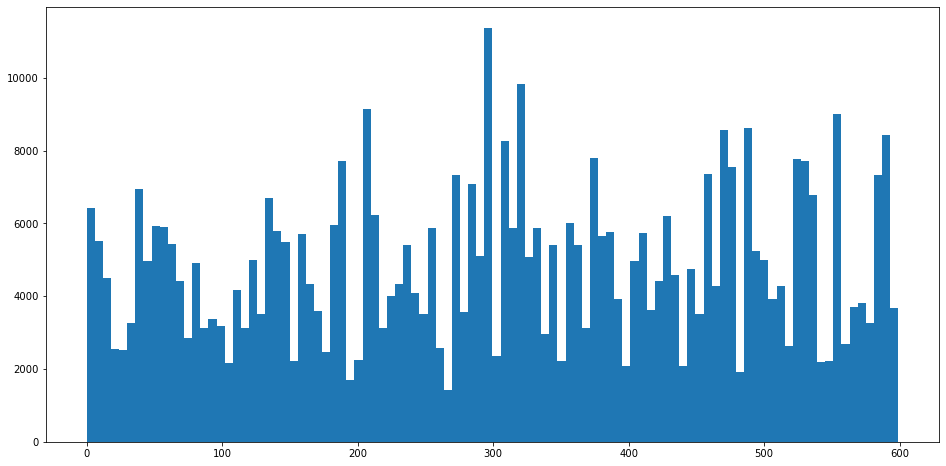

In [8]:
# old
print(train['sat_id'].unique().shape, train['sat_id'].unique().min(), train['sat_id'].unique().max())
print(test['sat_id'].unique().shape, test['sat_id'].unique().min(), test['sat_id'].unique().max())
plt.hist(np.bincount(train['sat_id'].to_numpy()), bins=50, label='train')
plt.hist(np.bincount(test['sat_id'].to_numpy()), bins=50, label='test')
train[train['sat_id'] == 0]
train.iloc[1]
train.info()
test.info()
plt.figure(figsize=(16,8))
t = plt.plot(train['epoch'][::500], train['x'][::500], label='x')
t = plt.plot(train['epoch'][::500], train['y'][::500], label='y')
t = plt.plot(train['epoch'][::500], train['z'][::500], label='z')
plt.figure(figsize=(16,8))
t = plt.plot(train['epoch'][::500], train['error'][::500], label='error')
np.bincount(train['sat_id'].to_numpy())
plt.figure(figsize=(16,8))
plt.hist(train['sat_id'], bins=100, label='train')

In [9]:
bc = np.bincount(train['sat_id'])
bc_min, bc_max = np.argmin(bc), np.argmax(bc)
print('Min: df[{}] = {}'.format(bc_min, bc[bc_min]))
print('Max: df[{}] = {}'.format(bc_max, bc[bc_max]))

Min: df[252] = 70
Max: df[372] = 4740


In [10]:
groups = [g for g in gen_groups(train)]

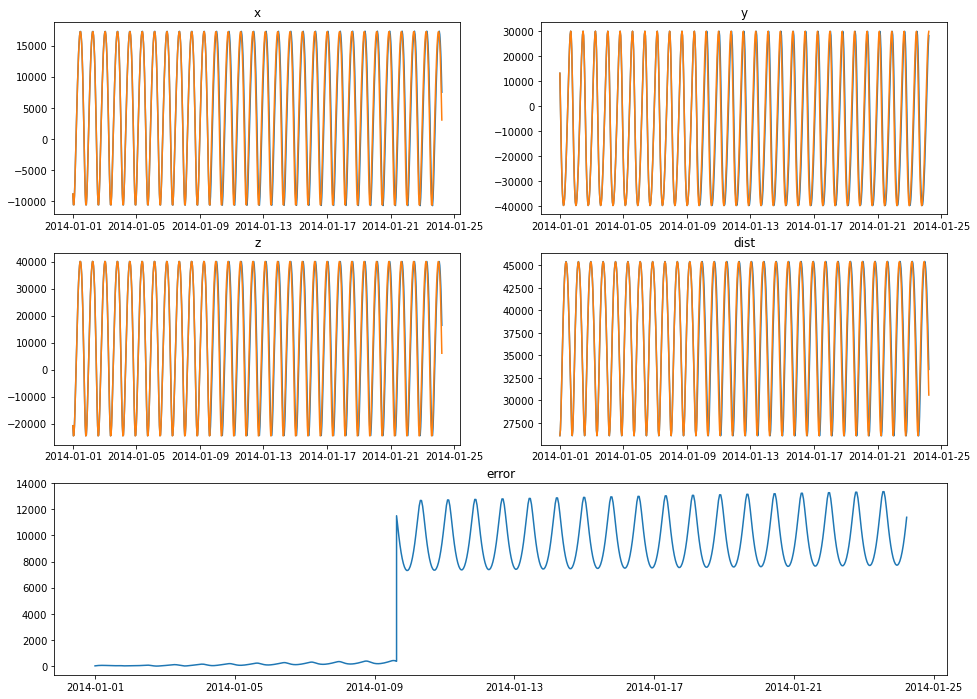

In [11]:
fig = plt.figure(figsize=(16,12))
ax1 = fig.add_subplot(321)
ax2 = fig.add_subplot(322) 
ax3 = fig.add_subplot(323)  
ax4 = fig.add_subplot(324)
ax5 = fig.add_subplot(313)

g = groups[0]

d = g['x'] ** 2 + g['y'] ** 2 + g['z'] ** 2

ax1.plot(g['epoch'], g['x'], label='x')
ax2.plot(g['epoch'], g['y'], label='y')
ax3.plot(g['epoch'], g['z'], label='z')
ax4.plot(g['epoch'], np.power(g['x'] ** 2 + g['y'] ** 2 + g['z'] ** 2, 0.5), label='dist')

ax1.plot(g['epoch'], g['x_sim'], label='xs')
ax2.plot(g['epoch'], g['y_sim'], label='ys')
ax3.plot(g['epoch'], g['z_sim'], label='zs')
ax4.plot(g['epoch'], np.power(g['x_sim'] ** 2 + g['y_sim'] ** 2 + g['z_sim'] ** 2, 0.5), label='dist 2')

ax5.plot(g['epoch'], g['error'], label='error')

ax1.set_title('x')
ax2.set_title('y')
ax3.set_title('z')
ax4.set_title('dist')
ax5.set_title('error')

t = plt.plot()

In [12]:
import time

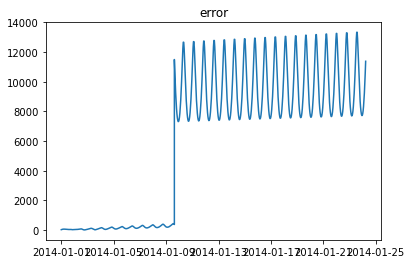

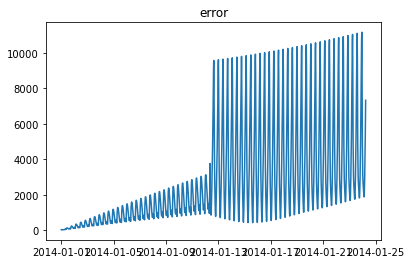

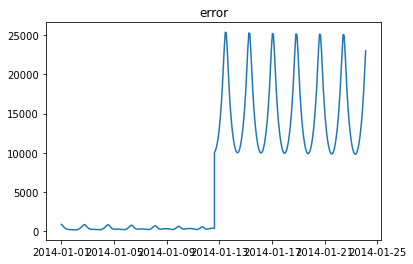

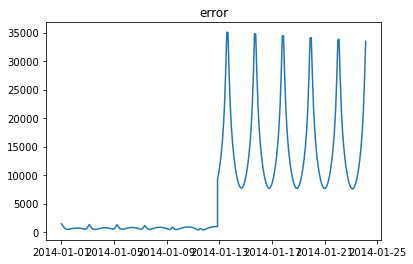

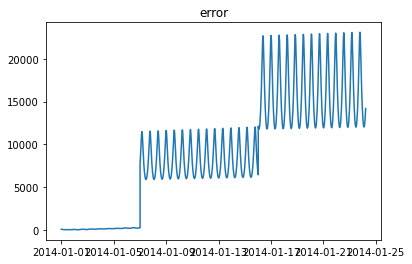

...

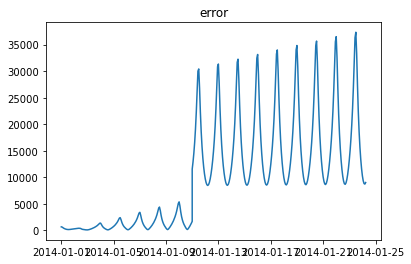

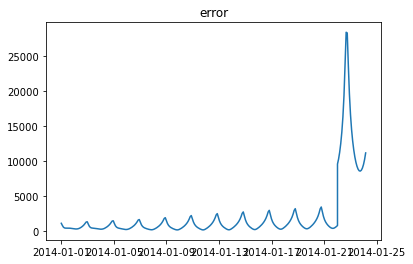

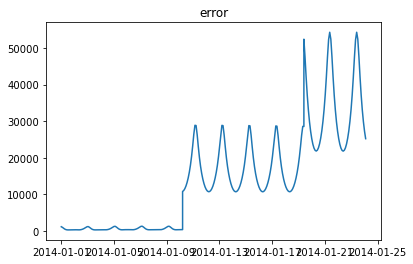

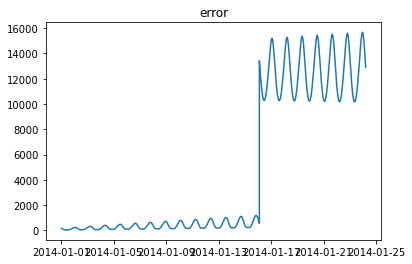

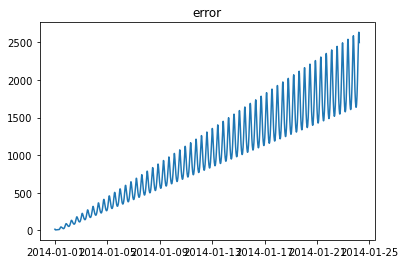

In [13]:
for g in groups:
    fig = plt.figure(figsize=(6,4))
    ax5 = fig.add_subplot(111)
    ax5.plot(g['epoch'], g['error'], label='error')
    ax5.set_title('error')
    plt.show()

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:2: FutureWarning: the 'freq'' keyword is deprecated, use 'period' instead
  


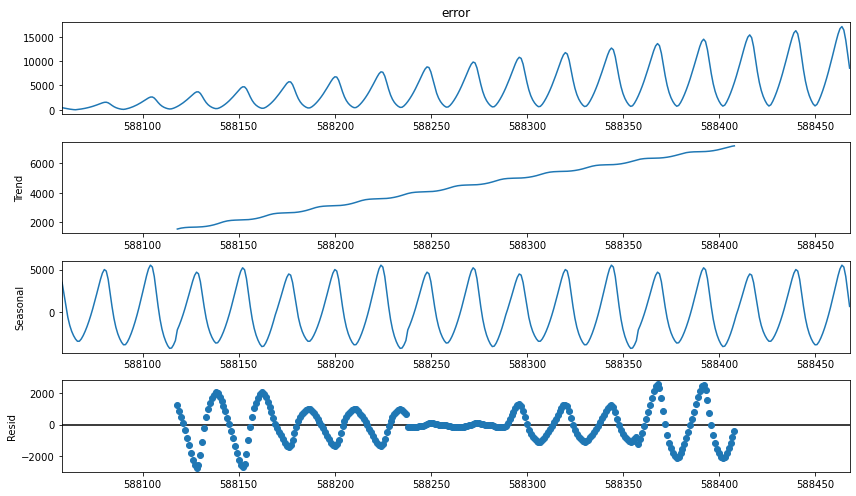

In [14]:
rcParams['figure.figsize'] = 12, 7
result = sm.tsa.seasonal_decompose(groups[300]['error'], model='additive',freq=60 * 2)
t = result.plot()

In [15]:
from statsmodels.tsa.stattools import adfuller
def test_stationarity(timeseries, window = 24, cutoff = 0.05):

    #Determing rolling statistics
    rolmean = timeseries.rolling(window).mean()
    rolstd = timeseries.rolling(window).std()

    #Plot rolling statistics:
    fig = plt.figure(figsize=(12, 4))
    orig = plt.plot(timeseries, color='blue',label='Original')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show()
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')
    
    plt.show()
    
    #Perform Dickey-Fuller test:
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries.values,autolag='AIC' )
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    pvalue = dftest[1]
    if pvalue < cutoff:
        print('p-value = %.4f. The series is likely stationary.' % pvalue)
    else:
        print('p-value = %.4f. The series is likely non-stationary.' % pvalue)
    
    print(dfoutput)

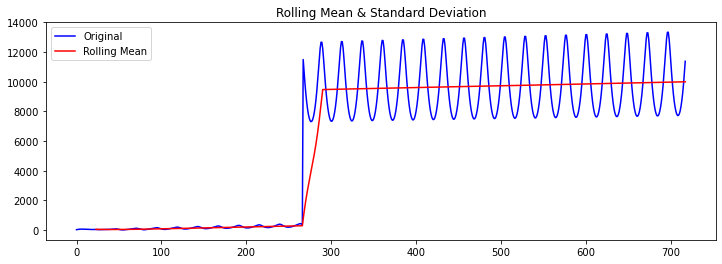

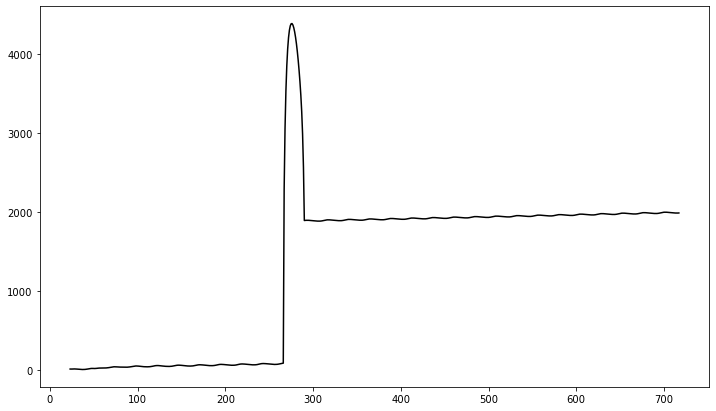

Results of Dickey-Fuller Test:
p-value = 0.7256. The series is likely non-stationary.
Test Statistic                  -1.073408
p-value                          0.725559
#Lags Used                      18.000000
Number of Observations Used    699.000000
Critical Value (1%)             -3.439740
Critical Value (5%)             -2.865684
Critical Value (10%)            -2.568977
dtype: float64


In [16]:
test_stationarity(groups[0]['error'])

In [17]:
n_groups = 600

### Среднее по группе

In [18]:
scores = []
for group in tqdm(gen_groups(train)):
    X = group.drop(['error'], axis=1).to_numpy()
    y = train['error'].to_numpy()

    for x_train, y_train, x_test, y_test in gen_val_data(X, y, 7):
        predict = np.mean(y_train) 
        scores.append(smape(y_test, predict))
    
score = np.mean(np.mean(np.array(scores).reshape(n_groups, -1), axis=0))

print('SMAPE for simple mean error: {}'.format(score))

600it [00:05, 108.17it/s]

SMAPE for simple mean error: 1.3116156363952671


In [19]:
train.head(2)

,epoch,sat_id,x,y,z,x_sim,y_sim,z_sim,type,dow,hour,minute,second,microsecond,error
id,,,,,,,,,,,,,,,
0,2014-01-01,0,-8855.823863,13117.780146,-20728.353233,-8843.131454,13138.221690,-20741.615306,train,2,0,0,0,0,27.474289
425647,2014-01-01,225,5323.330164,30487.040328,-3358.485973,5300.665952,30488.385893,-3387.286783,train,2,0,0,0,0,36.673747


### Регрессия по x,y,z

In [20]:
scores = []
for train_group in tqdm(gen_groups(train)):
    y = train_group['error'].to_numpy()
    X = train_group[['x_sim', 'y_sim', 'z_sim']].to_numpy()
    
    scaler = StandardScaler()
    scaler.fit(X)
    for x_train, y_train, x_test, y_test in gen_val_data(X, y, 7):
        x_train = scaler.transform(x_train)
        x_test = scaler.transform(x_test)
        model = LinearRegression()
        model.fit(x_train, y_train)
        predict = model.predict(x_test)
        scores.append(smape(y_test, predict))
        
score = np.mean(np.mean(np.array(scores).reshape(n_groups, -1), axis=0))

print('SMAPE for simple mean error: {}'.format(score))

600it [00:06, 95.13it/s] 

SMAPE for simple mean error: 0.683334881054296


In [21]:
pd.options.mode.chained_assignment = None

### Регрессия с dist

In [22]:
scores = []
for g in tqdm(gen_groups(train)):
    g['dist'] = (g.x ** 2 + g.y ** 2 + g.z ** 2) ** 0.5
    y = g['error'].to_numpy()
    X = g[['x_sim', 'y_sim', 'z_sim', 'dist']].to_numpy()
    
    scaler = StandardScaler()
    scaler.fit(X)
    for x_train, y_train, x_test, y_test in gen_val_data(X, y, 7):
        x_train = scaler.transform(x_train)
        x_test = scaler.transform(x_test)
        model = LinearRegression()
        model.fit(x_train, y_train)
        predict = model.predict(x_test)
        scores.append(smape(y_test, predict))
        
score = np.mean(np.mean(np.array(scores).reshape(n_groups, -1), axis=0))

print('SMAPE for simple mean error: {}'.format(score))

600it [00:07, 81.35it/s]

SMAPE for simple mean error: 0.6742103818419368


### Регрессия по x,y,z с d

In [23]:
scores = []
for train_group in tqdm(gen_groups(train)):
    g['dist'] = (g.x ** 2 + g.y ** 2 + g.z ** 2) ** 0.5
    y = g['error'].to_numpy()
    X = g[['x_sim', 'y_sim', 'z_sim', 'dist']].to_numpy()
    
    for x_train, y_train, x_test, y_test in gen_val_data(X, y, 7):
        res = []
        for i in range(3):
            model = LinearRegression()
            model.fit(np.hstack((x_train[:, i][:, None], x_train[:, 3][:, None])), y_train)
            res.append(model.predict(np.hstack((x_test[:, i][:, None], x_test[:, 3][:, None]))))
        coords = np.array(res).T
        predict = np.linalg.norm(coords - x_test[:, :3], axis=1)
        scores.append(smape(y_test, predict))
        
score = np.mean(np.mean(np.array(scores).reshape(n_groups, -1), axis=0))

print('SMAPE for simple mean error: {}'.format(score))

600it [00:10, 57.28it/s]

SMAPE for simple mean error: 1.809420377296384


### Тройное экспоненциальное сглаживание

In [24]:
for sn in tqdm(np.arange(2,15,1)):
    scores = []
    for train_group in gen_groups(train):
        #g['dist'] = (g.x ** 2 + g.y ** 2 + g.z ** 2) ** 0.5
        y = g['error'].to_numpy()
        #X = g[['x_sim', 'y_sim', 'z_sim']].to_numpy()
        y_train = y[-200:-100]
        y_test = y[-100:]
        
        fit = ExponentialSmoothing(np.asarray(y_train), 
                                       seasonal_periods=sn ,trend='add', seasonal='add',).fit()
        predict = fit.forecast(y_test.size)
        scores.append(smape(y_test, predict))

    score = np.mean(np.mean(np.array(scores).reshape(n_groups, -1), axis=0))

    print('SMAPE for simple mean error: {}'.format(score))

  0%|          | 0/13 [00:00<?, ?it/s]/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/holtwinters.py:744: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/holtwinters.py:744: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/holtwinters.py:744: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/holtwinters.py:744: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/holtwinters.py:744: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/holtwinters.py:744: ConvergenceWarning: Optimization failed to

SMAPE for simple mean error: 1.1363981847105935


/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/holtwinters.py:744: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/holtwinters.py:744: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/holtwinters.py:744: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/holtwinters.py:744: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/holtwinters.py:744: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/holtwinters.py:744: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  Conver

SMAPE for simple mean error: 1.1422262611397367


/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/holtwinters.py:744: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/holtwinters.py:744: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/holtwinters.py:744: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/holtwinters.py:744: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/holtwinters.py:744: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/holtwinters.py:744: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  Conver

SMAPE for simple mean error: 1.1450627937383862


/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/holtwinters.py:744: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/holtwinters.py:744: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/holtwinters.py:744: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/holtwinters.py:744: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/holtwinters.py:744: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/holtwinters.py:744: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  Conver

SMAPE for simple mean error: 1.136851723307589


 38%|███▊      | 5/13 [04:34<07:14, 54.28s/it]

SMAPE for simple mean error: 1.1073789990867817


 46%|████▌     | 6/13 [05:25<06:12, 53.25s/it]

SMAPE for simple mean error: 0.5154935378474674


 54%|█████▍    | 7/13 [06:16<05:16, 52.72s/it]

SMAPE for simple mean error: 0.611947357699893


 62%|██████▏   | 8/13 [07:08<04:22, 52.54s/it]

SMAPE for simple mean error: 1.4827466511090748


 69%|██████▉   | 9/13 [07:59<03:28, 52.01s/it]

SMAPE for simple mean error: 1.3885473189860393


 77%|███████▋  | 10/13 [08:48<02:33, 51.26s/it]

SMAPE for simple mean error: 1.176300336072795


 85%|████████▍ | 11/13 [09:38<01:41, 50.84s/it]

SMAPE for simple mean error: 0.2737578148773368


/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/holtwinters.py:744: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/holtwinters.py:744: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/holtwinters.py:744: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/holtwinters.py:744: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/holtwinters.py:744: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/holtwinters.py:744: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  Conver

SMAPE for simple mean error: 1.3723844271745316


/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/holtwinters.py:744: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/holtwinters.py:744: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/holtwinters.py:744: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/holtwinters.py:744: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/holtwinters.py:744: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)
/opt/conda/lib/python3.7/site-packages/statsmodels/tsa/holtwinters.py:744: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  Conver

SMAPE for simple mean error: 1.6462115036436342


### Регрессия с dist и лагами

In [25]:
scores = []
for tg in tqdm(gen_groups(train)):
    tg['dist'] = (tg.x_sim ** 2 + tg.y_sim ** 2 + tg.z_sim ** 2) ** 0.5
    g = tg.loc[:]
    lag_period = 30
    features = []
    for period_mult in range(1, 10, 1):
        tg["lag_period_{}".format(period_mult)] = tg.dist.shift(period_mult * lag_period)
        features.append("lag_period_{}".format(period_mult))
    tg['lagf_mean'] = tg[features].mean(axis = 1)
    tg.dropna(inplace = True)
    
    if tg.shape[0] > 30:
        g = tg.loc[:]
    
    y = g['error'].to_numpy()
    X = g.drop(['x', 'y', 'z', 'epoch', 'sat_id', 'type', 'error',
                'dow', 'hour', 'minute','second', 'microsecond'], axis=1).to_numpy()
    
    scaler = StandardScaler()
    scaler.fit(X)
    for x_train, y_train, x_test, y_test in gen_val_data(X, y, 7):
        x_train = scaler.transform(x_train)
        x_test = scaler.transform(x_test)
        model = LinearRegression()
        model.fit(x_train, y_train)
        predict = model.predict(x_test)
        scores.append(smape(y_test, predict))
        
score = np.mean(np.mean(np.array(scores).reshape(n_groups, -1), axis=0))

print('SMAPE for simple mean error: {}'.format(score))

600it [00:13, 44.72it/s]

SMAPE for simple mean error: 0.40929633608691673


In [26]:
# 0.40459591123715793

In [27]:
def val_lag(lag_p):
    scores = []
    for tg in tqdm(gen_groups(train)):
        tg['dist'] = (tg.x_sim ** 2 + tg.y_sim ** 2 + tg.z_sim ** 2) ** 0.5
        g = tg.loc[:]
        lag_period = lag_p
        features = []
        for period_mult in range(1, 10, 1):
            tg["lag_period_{}".format(period_mult)] = tg.dist.shift(period_mult * lag_period)
            features.append("lag_period_{}".format(period_mult))
        tg['lagf_mean'] = tg[features].mean(axis = 1)
        tg.dropna(inplace = True)

        if tg.shape[0] > 70: # 30a
            g = tg.loc[:]

        y = g['error'].to_numpy()
        X = g.drop(['x', 'y', 'z', 'epoch', 'sat_id', 'type', 'error',
                'dow', 'hour', 'minute','second', 'microsecond'], axis=1).to_numpy()

        scaler = StandardScaler()
        scaler.fit(X)
        for x_train, y_train, x_test, y_test in gen_val_data(X, y, 7):
            x_train = scaler.transform(x_train)
            x_test = scaler.transform(x_test)
            model = LinearRegression()
            model.fit(x_train, y_train)
            predict = model.predict(x_test)
            scores.append(smape(y_test, predict))

    score = np.mean(np.mean(np.array(scores).reshape(n_groups, -1), axis=0))

    print('SMAPE for simple mean error: {}'.format(score))

In [28]:
for i in range(25, 36, 5): # 35 
    val_lag(i)

600it [00:15, 39.85it/s]
5it [00:00, 41.34it/s]

SMAPE for simple mean error: 0.4499039473563665


600it [00:14, 42.00it/s]
4it [00:00, 37.48it/s]

SMAPE for simple mean error: 0.42658010788303224


600it [00:14, 41.54it/s]

SMAPE for simple mean error: 0.4312239445917551


In [29]:
def val_lag_dist2(lag_p):
    scores = []
    for tg in tqdm(gen_groups(train)):
        tg['dist'] = (tg.x_sim ** 2 + tg.y_sim ** 2 + tg.z_sim ** 2) ** 0.5
        g = tg.loc[:]
        lag_period = lag_p
        features, d_features = [], []
        for period_mult in range(1, 15, 1):
            tg["lag_period_{}".format(period_mult)] = tg.dist.shift(period_mult * lag_period)
            features.append("lag_period_{}".format(period_mult))
        tg['dist_lagf_mean'] = tg[features].mean(axis = 1)
        tg.dropna(inplace = True)

        if tg.shape[0] > 70:
            g = tg.loc[:]

        y = g['error'].to_numpy()
        X = g.drop(['x', 'y', 'z', 'epoch', 'sat_id', 'type', 'error',
                'dow', 'hour', 'minute','second', 'microsecond'], axis=1).to_numpy()

        scaler = StandardScaler()
        scaler.fit(X)
        for x_train, y_train, x_test, y_test in gen_val_data(X, y, 7):
            x_train = scaler.transform(x_train)
            x_test = scaler.transform(x_test)
            model = LinearRegression()
            model.fit(x_train, y_train)
            predict = model.predict(x_test)
            scores.append(smape(y_test, predict))

    score = np.mean(np.mean(np.array(scores).reshape(n_groups, -1), axis=0))

    print('SMAPE for simple mean error: {}'.format(score))

In [30]:
for i in range(30, 46, 5):
    val_lag_dist2(i)

600it [00:15, 38.36it/s]
4it [00:00, 34.74it/s]

SMAPE for simple mean error: 0.4463897196961341


600it [00:16, 37.18it/s]
3it [00:00, 24.03it/s]

SMAPE for simple mean error: 0.4475597600374527


600it [00:16, 36.60it/s]
5it [00:00, 41.66it/s]

SMAPE for simple mean error: 0.4911606468635784


600it [00:16, 36.76it/s]

SMAPE for simple mean error: 0.4849351386966373


In [31]:
a = []
for tg in gen_groups(train):
    t = tg[tg['epoch'].dt.day >= 18]
    a.append((t.shape[0], tg.shape[0]))
    
print(sorted(a)[:10])

[(18, 70), (20, 74), (21, 82), (22, 83), (23, 90), (24, 90), (24, 90), (24, 91), (25, 97), (26, 96)]


### Регрессия по последним дням

In [32]:
def val_last_dist(days):
    scores = []
    for g in tqdm(gen_groups(train)):
        g['dist'] = (g.x_sim ** 2 + g.y_sim ** 2 + g.z_sim ** 2) ** 0.5
        tg = g[g['epoch'].dt.day >= days]
        if tg.shape[0] > 70:
            g = tg.loc[:]

        y = g['error'].to_numpy()
        X = g[['x_sim', 'y_sim', 'z_sim', 'dist']].to_numpy()

        scaler = StandardScaler()
        scaler.fit(X)
        for x_train, y_train, x_test, y_test in gen_val_data(X, y, 7):
            x_train = scaler.transform(x_train)
            x_test = scaler.transform(x_test)
            model = LinearRegression()
            model.fit(x_train, y_train)
            predict = model.predict(x_test)
            scores.append(smape(y_test, predict))

    score = np.mean(np.mean(np.array(scores).reshape(n_groups, -1), axis=0))

    print('j = {}. SMAPE for simple mean error: {}'.format(days, score))

In [33]:
for i in range(1, 22, 1):
    val_last_dist(i)

600it [00:08, 72.68it/s]
9it [00:00, 81.77it/s]

j = 1. SMAPE for simple mean error: 0.6728846041408492


600it [00:08, 74.23it/s]
7it [00:00, 62.63it/s]

j = 2. SMAPE for simple mean error: 0.6324878551357574


600it [00:07, 78.10it/s]
8it [00:00, 79.00it/s]

j = 3. SMAPE for simple mean error: 0.5976905977543219


600it [00:08, 73.61it/s]
7it [00:00, 69.70it/s]

j = 4. SMAPE for simple mean error: 0.5674664567936026


600it [00:08, 72.77it/s]
7it [00:00, 65.21it/s]

j = 5. SMAPE for simple mean error: 0.5344459166272679


600it [00:07, 78.52it/s]
8it [00:00, 77.66it/s]

j = 6. SMAPE for simple mean error: 0.502705605870785


600it [00:07, 77.90it/s]
8it [00:00, 79.32it/s]

j = 7. SMAPE for simple mean error: 0.47018919005318377


600it [00:07, 76.00it/s]
7it [00:00, 63.58it/s]

j = 8. SMAPE for simple mean error: 0.43274547035797756


600it [00:08, 72.74it/s]
7it [00:00, 65.00it/s]

j = 9. SMAPE for simple mean error: 0.4029908980415722


600it [00:07, 77.80it/s]
9it [00:00, 83.56it/s]

j = 10. SMAPE for simple mean error: 0.3768774976556055


600it [00:07, 78.83it/s]
9it [00:00, 84.44it/s]

j = 11. SMAPE for simple mean error: 0.3497531162757454


600it [00:07, 81.90it/s]
9it [00:00, 83.44it/s]

j = 12. SMAPE for simple mean error: 0.32989353823385414


600it [00:08, 71.98it/s]
7it [00:00, 69.92it/s]

j = 13. SMAPE for simple mean error: 0.31638736542872653


600it [00:07, 77.92it/s]
9it [00:00, 81.04it/s]

j = 14. SMAPE for simple mean error: 0.3080338054111072


600it [00:07, 80.09it/s]
7it [00:00, 64.13it/s]

j = 15. SMAPE for simple mean error: 0.29881476621824093


600it [00:07, 76.14it/s]
7it [00:00, 63.49it/s]

j = 16. SMAPE for simple mean error: 0.2906272528919306


600it [00:08, 67.71it/s]
8it [00:00, 71.11it/s]

j = 17. SMAPE for simple mean error: 0.30048755639165053


600it [00:07, 80.08it/s]
9it [00:00, 82.12it/s]

j = 18. SMAPE for simple mean error: 0.3011290345046328


600it [00:07, 77.72it/s]
7it [00:00, 68.67it/s]

j = 19. SMAPE for simple mean error: 0.3226292096223003


600it [00:07, 82.57it/s]
9it [00:00, 86.48it/s]

j = 20. SMAPE for simple mean error: 0.3453872734880708


600it [00:08, 71.19it/s]

j = 21. SMAPE for simple mean error: 0.3987171308365684


In [34]:
best_split = 16
# SMAPE for simple mean error: 0.22949512241582815 #30

## Рисуем предсказания

In [35]:
def val_lag(lag_p):
    scores = []
    for tg in tqdm(gen_groups(train)):
        tg['dist'] = (tg.x_sim ** 2 + tg.y_sim ** 2 + tg.z_sim ** 2) ** 0.5
        g = tg.loc[:]
        lag_period = lag_p
        features = []
        for period_mult in range(1, 10, 1):
            tg["lag_period_{}".format(period_mult)] = tg.dist.shift(period_mult * lag_period)
            features.append("lag_period_{}".format(period_mult))
        tg['lagf_mean'] = tg[features].mean(axis = 1)
        tg.dropna(inplace = True)

        if tg.shape[0] > 70: # 30
            g = tg.loc[:]

        y = g['error'].to_numpy()
        X = g.drop(['x', 'y', 'z', 'epoch', 'sat_id', 'type', 'error',
                'dow', 'hour', 'minute','second', 'microsecond'], axis=1).to_numpy()

        scaler = StandardScaler()
        scaler.fit(X)
        for x_train, y_train, x_test, y_test in gen_val_data(X, y, 7):
            x_train = scaler.transform(x_train)
            x_test = scaler.transform(x_test)
            model = LinearRegression()
            model.fit(x_train, y_train)
            predict = model.predict(x_test)
            scores.append(smape(y_test, predict))

    score = np.mean(np.mean(np.array(scores).reshape(n_groups, -1), axis=0))

    print('SMAPE for simple mean error: {}'.format(score))

In [36]:
new_test = test.loc[:]
new_test['target'] = 0

In [37]:
new_test.head(2)

,epoch,sat_id,x_sim,y_sim,z_sim,type,dow,hour,minute,second,microsecond,target
id,,,,,,,,,,,,
887375,2014-01-24 00:25:19.430,441,-133507.692131,-128055.380848,23849.499408,test,4,0,25,19,430000,0
810351,2014-01-24 00:48:40.630,402,149643.611595,108519.246290,91747.193212,test,4,0,48,40,630000,0


In [38]:
def get_predict(train, test):
    lag_p = 35
    for g, g_test in tqdm(zip(gen_groups(train), gen_groups(test))):
        tg['dist'] = (tg.x_sim ** 2 + tg.y_sim ** 2 + tg.z_sim ** 2) ** 0.5
        gtg['dist'] = (tg.x_sim ** 2 + tg.y_sim ** 2 + tg.z_sim ** 2) ** 0.5
        
        g = tg.loc[:]
        gg = gtg.loc[:]
        
        lag_period = lag_p
        
        features = []
        for period_mult in range(1, 10, 1):
            tg["lag_period_{}".format(period_mult)] = tg.dist.shift(period_mult * lag_period)
            gtg["lag_period_{}".format(period_mult)] = gtg.dist.shift(period_mult * lag_period)
            features.append("lag_period_{}".format(period_mult))
        
        tg['lagf_mean'] = tg[features].mean(axis = 1)
        tg.dropna(inplace = True)
        
        gtg['lagf_mean'] = gtg[features].mean(axis = 1)
        gtg.dropna(inplace = True)

        if tg.shape[0] > 70:
            g = tg.loc[:]

        y = g['error'].to_numpy()
        X_train = g.drop(['x', 'y', 'z', 'epoch', 'sat_id', 'type', 'error',
                'dow', 'hour', 'minute','second', 'microsecond'], axis=1).to_numpy()
        X_test = g_test.drop(['epoch', 'sat_id', 'type', 'dow', 'hour', 
                'minute','second', 'microsecond', 'target'], axis=1).to_numpy()
        
        scaler = StandardScaler()
        scaler.fit(X_train)
        
        X_train = scaler.transform(X_train)
        X_test = scaler.transform(X_test)
        
        model = LinearRegression()
        model.fit(X_train, y)
        
        predict = model.predict(X_test)
        X_test['target'] = predict
        yield X_test

In [40]:
def test_last_dist(train, test):
    days = 16
    for g_train, g_test in zip(gen_groups(train), gen_groups(test)):
        g_train['dist'] = (g_train.x_sim ** 2 + g_train.y_sim ** 2 + g_train.z_sim ** 2) ** 0.5
        g_test['dist'] = (g_test.x_sim ** 2 + g_test.y_sim ** 2 + g_test.z_sim ** 2) ** 0.5
        
        tg_train = g_train[g_train['epoch'].dt.day >= days]
        if tg_train.shape[0] > 70:
            g_train = tg_train.loc[:]

        y = g_train['error'].to_numpy()
        X_train = g_train[['x_sim', 'y_sim', 'z_sim', 'dist']].to_numpy()
        
        X_test = g_test[['x_sim', 'y_sim', 'z_sim', 'dist']].to_numpy()

        scaler = StandardScaler()
        scaler.fit(X_train)
        
        X_train = scaler.transform(X_train)
        X_test = scaler.transform(X_test)
        
        model = LinearRegression()
        model.fit(X_train, y)
        
        predict = model.predict(X_test)
        g_test['target'] = predict
        yield g_test[['target']]

In [41]:
submit = pd.concat([dfr for dfr in test_last_dist(train, new_test)])
submit.sort_index(inplace=True)

In [42]:
save_submit(submit['target'], new_test, 'sub_last_linear2.csv')

### DONE:
- время распарсить
- разделить на train и test
- сорт по времени train и test
- посчитать и выделить 'error' в train
- функция SMAPE
- функция разделения на группы
- построить график по времени от x, y, z и разности?
- посмотреть распределение групп sat_id, мб построить для них графики
- Сделать две больших функции: 1) предсказываем x,y,z, return pred 2) предсказываем error, return pred [решить, что предсказывать - каждую из координат, некоторые из координаты или ошибку.]. ПРАВИЛЬНАЯ ВАЛИДАЦИЯ(есть у Измайлова)!!
- посмотреть скор на трейне моего решения
- one-hot/target для дней и дат - считаем, что даты бесполезные
- Dickey-Fuller Test - стационарны ли ряды: x,y,z - да, error - нет
- линейные модели - регрессия
- добавить признак(нелинейность) - x**2 + y**2 + z**2 и посмотреть, что со скором происходит
- можно добавить лаговые фичи
- составить набор из датасетов с разными фичами, смотреть что лучше работает
- тройное эксп сглаживание, скор для x,y,z и error
- плавающее среднее
- взвешенное среднее

### TODO:

- prophet
- попробовать среднее между моделями

In [43]:
submit = [train['error'].mean()] * test.shape[0]
save_submit(submit, test)